In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals
import pandas as pd
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import keras
import numpy as np
import os
from tqdm import tqdm
import cv2
from glob import glob
from skimage.transform import resize
from skimage.color import rgb2gray
import random
import datetime
import seaborn as sns
print(tf.__version__)

2.17.0


In [4]:
# Define directories for the dataset
train_dir = "PotatoPlants/train/"
test_dir = "PotatoPlants/test/"

LOAD_FROM_IMAGES = True

def get_data(folder):
    X = []
    y = []
    for folderName in os.listdir(folder):
        if not folderName.startswith('.'):
            if folderName in ['Potato___Early_blight']:
                label = 0
            elif folderName in ['Potato___Late_blight']:
                label = 1
            elif folderName in ['Potato___healthy']:
                label = 2
            for image_filename in tqdm(os.listdir(folder + folderName)):
                img_file = cv2.imread(folder + folderName + '/' + image_filename)
                if img_file is not None:
                    img_file = resize(img_file, (256, 256, 3), mode='constant', anti_aliasing=True)
                    img_arr = np.asarray(img_file)
                    X.append(img_arr)
                    y.append(label)
    X = np.asarray(X)
    y = np.asarray(y)
    return X, y

if LOAD_FROM_IMAGES:
    # Load images into arrays
    X_train, y_train = get_data(train_dir)
    X_test, y_test = get_data(test_dir)
    
    # Save arrays to files
    np.save('xtrain.npy', X_train)
    np.save('ytrain.npy', y_train)
    np.save('xtest.npy', X_test)
    np.save('ytest.npy', y_test)
else:
    # Load previously saved arrays
    X_train = np.load('xtrain.npy')
    y_train = np.load('ytrain.npy')
    X_test = np.load('xtest.npy')
    y_test = np.load('ytest.npy')

100%|██████████| 48/48 [00:01<00:00, 31.28it/s]


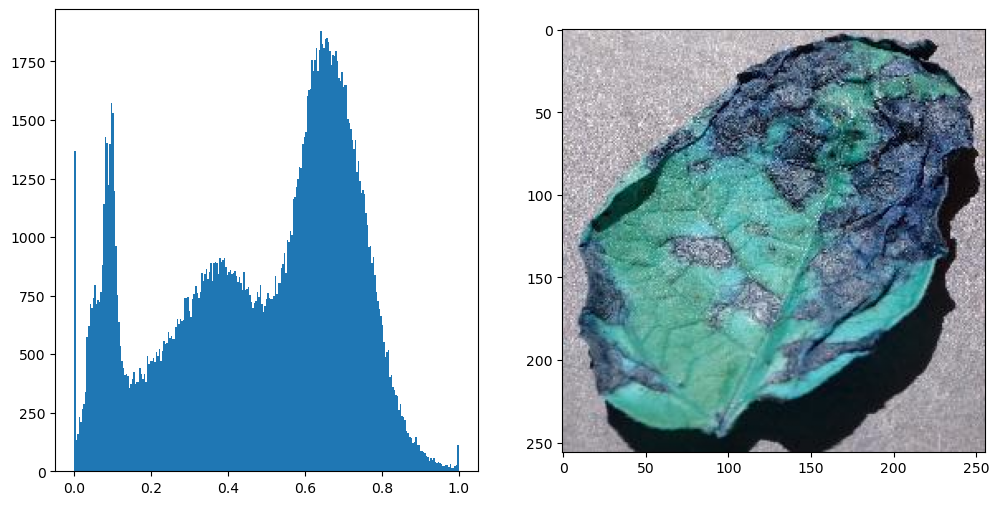

In [5]:
def plotHistogram(a):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.hist(a.ravel(), bins=255)
    plt.subplot(1, 2, 2)
    plt.imshow(a, cmap='gray', vmin=0, vmax=1)
    plt.show()
plotHistogram(X_train[3])

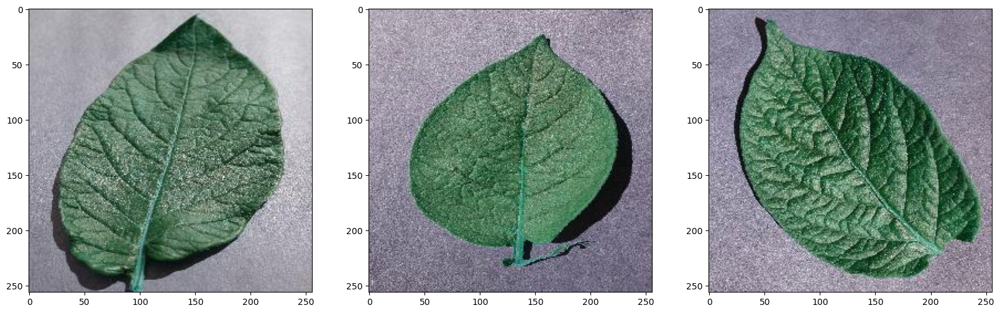

In [6]:
multipleImages = glob('PotatoPlants/train/Potato___healthy/**')
def plotThreeImages(images):
    r = random.sample(images, 3)
    plt.figure(figsize=(20, 20))
    plt.subplot(131)
    plt.imshow(cv2.imread(r[0]))
    plt.subplot(132)
    plt.imshow(cv2.imread(r[1]))
    plt.subplot(133)
    plt.imshow(cv2.imread(r[2]))
    
plotThreeImages(multipleImages)


Early Blight


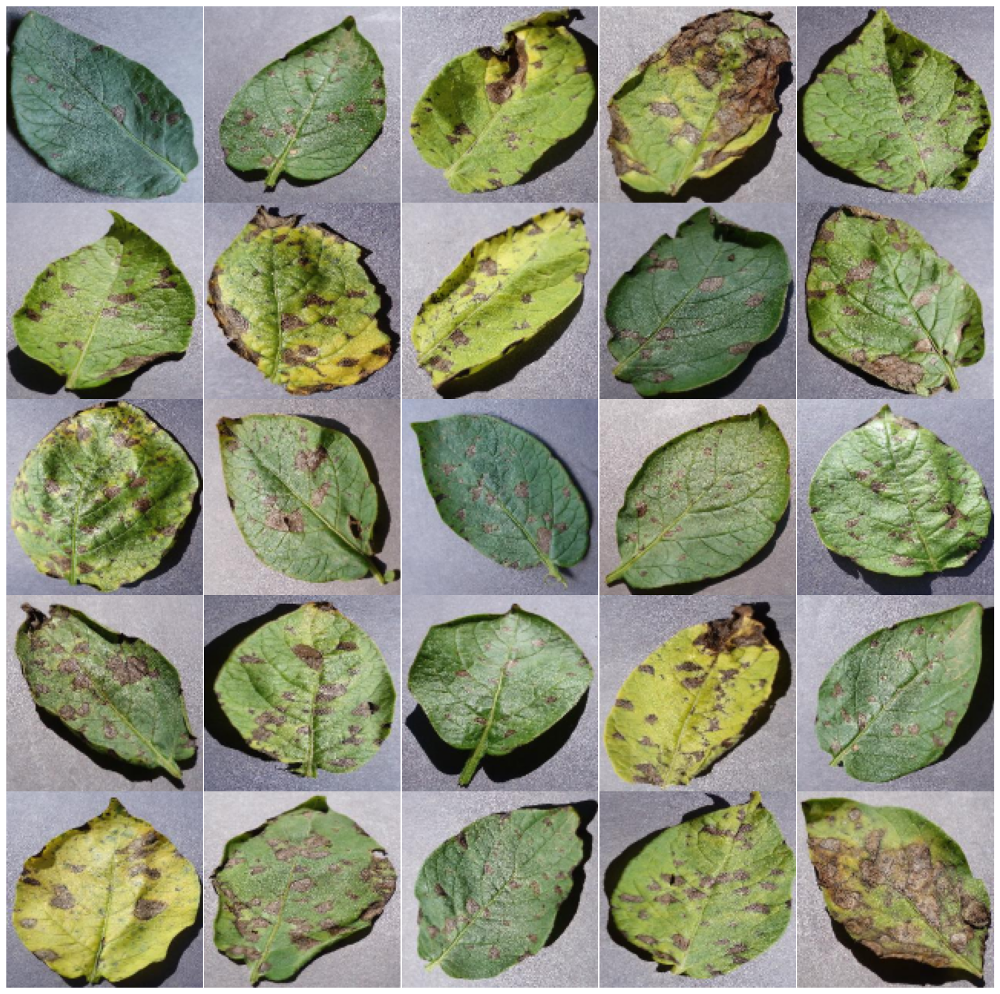

In [7]:
print("Early Blight")
multipleImages = glob('PotatoPlants/train/Potato___Early_blight/**')
i_ = 0
plt.rcParams['figure.figsize'] = (20.0, 20.0)
plt.subplots_adjust(wspace=0, hspace=0)
for l in multipleImages[:25]:
    im = cv2.imread(l)
    im = cv2.resize(im, (128, 128)) 
    plt.subplot(5, 5, i_ + 1)
    plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    i_ += 1


Late Blight


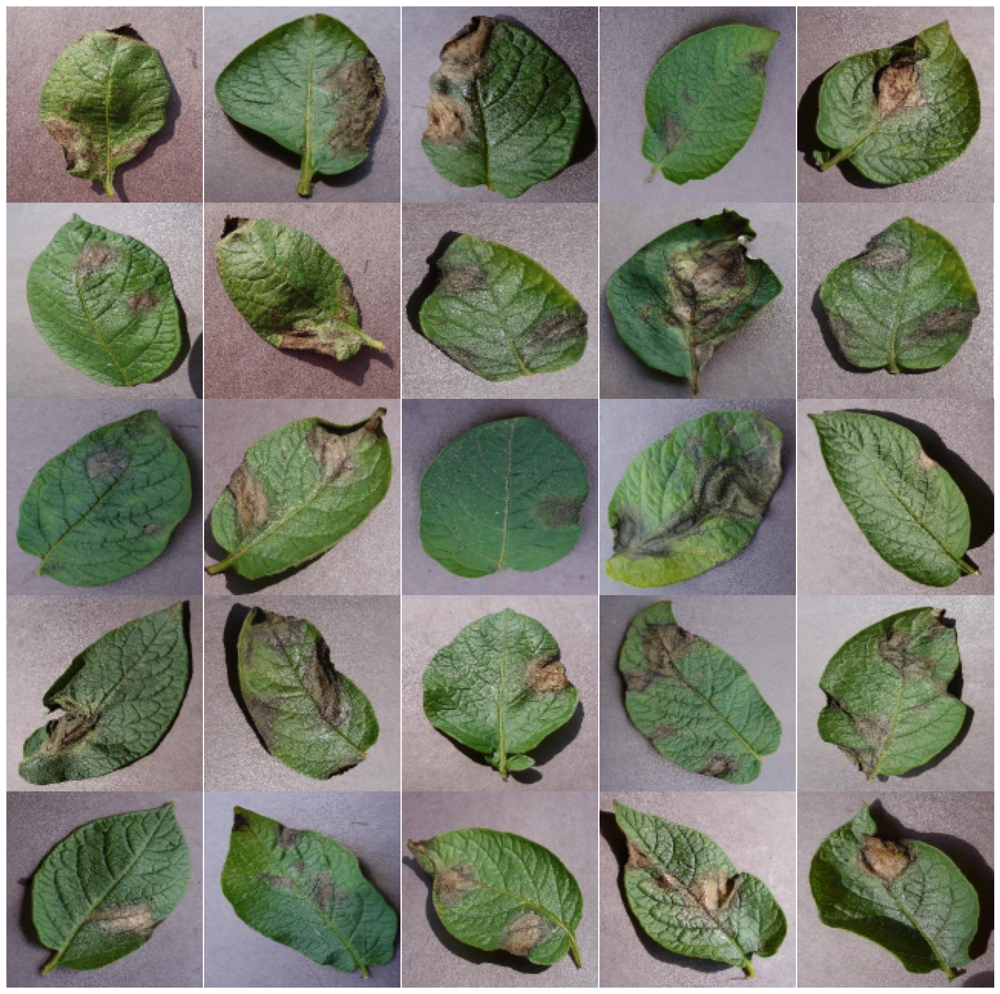

In [8]:
print("Late Blight")
multipleImages = glob('PotatoPlants/train/Potato___Late_blight/**')
i_ = 0
plt.rcParams['figure.figsize'] = (20.0, 20.0)
plt.subplots_adjust(wspace=0, hspace=0)
for l in multipleImages[:25]:
    im = cv2.imread(l)
    im = cv2.resize(im, (128, 128)) 
    plt.subplot(5, 5, i_ + 1)
    plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    i_ += 1

{0: 'Potato___Early_blight', 1: 'Potato___Late_blight', 2: 'Potato___healthy'}


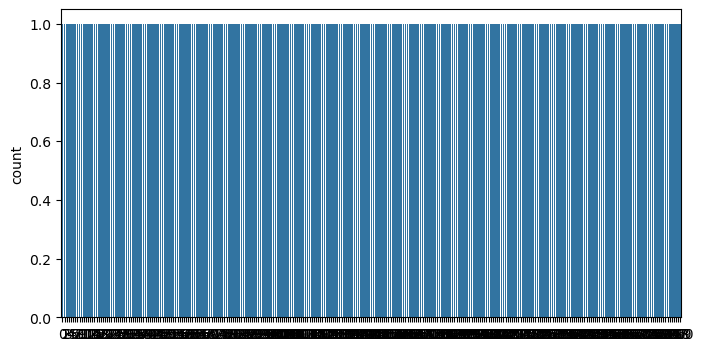

In [9]:
plt.figure(figsize=(8, 4))
map_characters = {0: 'Potato___Early_blight', 1: 'Potato___Late_blight', 2: 'Potato___healthy'}
dict_characters = map_characters
df = pd.DataFrame()
df["labels"] = y_train
lab = df['labels']
dist = lab.value_counts()
sns.countplot(lab)
print(dict_characters)

In [10]:
X_trainReshaped = X_train.reshape(len(X_train), 256, 256, 3)
X_testReshaped = X_test.reshape(len(X_test), 256, 256, 3)

In [13]:
model = models.Sequential()
model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))

model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 254, 254, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 127, 127, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 125, 125, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │     3,211,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,324,099 (12.68 MB)

 Trainable params: 3,324,099 (12.68 MB)

 Non-trainable params: 0 (0.00 B)

In [18]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [19]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir, histogram_freq=1)

model.fit(X_trainReshaped, y_train, epochs=3, validation_data=(X_testReshaped, y_test), callbacks=[tensorboard_callback])

Epoch 1/3
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 4s/step - accuracy: 0.3975 - loss: 1.0912 - val_accuracy: 0.7431 - val_loss: 0.7512
Epoch 2/3
10/10 ━━━━━━━━━━━━━━━━━━━━ 43s 4s/step - accuracy: 0.6528 - loss: 0.7423 - val_accuracy: 0.8056 - val_loss: 0.4023
Epoch 3/3
10/10 ━━━━━━━━━━━━━━━━━━━━ 40s 4s/step - accuracy: 0.8221 - loss: 0.5060 - val_accuracy: 0.7708 - val_loss: 0.5429


In [20]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_testReshaped, y_test)
print(test_acc)


5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 519ms/step - accuracy: 0.7201 - loss: 0.6134
0.7708333134651184


In [21]:
test_loss, test_acc = model.evaluate(X_trainReshaped, y_train)
print(test_acc)


10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 548ms/step - accuracy: 0.7042 - loss: 0.6455
0.7731958627700806


In [22]:
keras.saving.save_model(model, 'my_model.keras')